In [1]:
import os

import cv2
import numpy as np
import imutils

from matplotlib import pyplot as plt
from PIL import Image as pil_image
from skimage.feature import peak_local_max
from skimage.morphology import watershed
from scipy import ndimage

# Utilities

In [2]:
def imgs_show(imgs, rows, fontsize=36):
    fig = plt.figure()
    for n, (img, title) in enumerate(imgs):
        a = fig.add_subplot(rows, np.ceil(len(imgs)/float(rows)), n + 1)
        a.set_title(title, fontdict={"fontsize": fontsize})
        plt.imshow(img)
    fig.set_size_inches(np.array(fig.get_size_inches()) * len(imgs))
    plt.show()
    
def img_show(img, title = '', figsize=(10, 5)):
    plt.figure(figsize=figsize)
    plt.imshow(img)
    plt.title(title)
    plt.show()

def read_folder(folder, ext):
    images = []

    for r, d, f in os.walk(folder):
        for file in f:
            if file.endswith(ext):
                path = os.path.join(r, file)
                images.append(np.array(pil_image.open(path)))
    return images

# Images

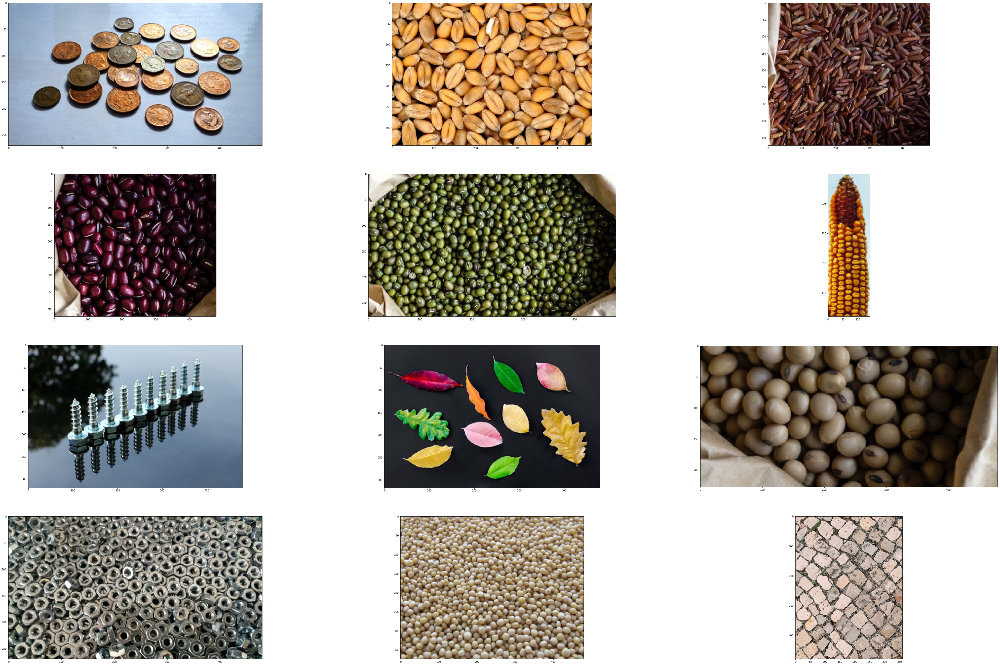

In [3]:
images = read_folder('./count/', '.jpg')
imgs_show([(img, "") for img in images], 4)

# Estimate number of objects

In [4]:
class NumberOfObjectsEstimator:
    def __threshold(img, adeptive=True, type_of_threshold=cv2.THRESH_BINARY | cv2.THRESH_OTSU):
        shifted = cv2.pyrMeanShiftFiltering(img, 21, 51)
        gray = cv2.cvtColor(shifted, cv2.COLOR_BGR2GRAY)
        if adeptive:
            return gray, cv2.adaptiveThreshold(gray, 255, type_of_threshold, cv2.THRESH_BINARY, 11, 2)
        return gray, cv2.threshold(gray, 127, 255, type_of_threshold)[1]
    
    @staticmethod
    def run(img, adeptive=True, use_cicrle=True, type_of_threshold=cv2.THRESH_BINARY | cv2.THRESH_OTSU, min_distance=15):
        gray, thresh = NumberOfObjectsEstimator.__threshold(img, adeptive, type_of_threshold)
        img_show(thresh)
        
        cnts = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        D = ndimage.distance_transform_edt(thresh)
        localMax = peak_local_max(D, indices=False, min_distance=min_distance, labels=thresh)
        markers = ndimage.label(localMax, structure=np.ones((3, 3)))[0]
        labels = watershed(-D, markers, mask=thresh)
        
        count = 0
        result = np.copy(img)
        
        for label in np.unique(labels):
            if label == 0:
                continue

            mask = np.zeros(gray.shape, dtype="uint8")
            mask[labels == label] = 255

            cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            cnts = imutils.grab_contours(cnts)
            
            c = max(cnts, key=cv2.contourArea)
            ((x, y), r) = cv2.minEnclosingCircle(c)
            if use_cicrle:
                cv2.circle(result, (int(x), int(y)), int(r), (0, 255, 0), 2)
            else:
                cv2.drawContours(result, [c], -1, (0, 255, 0), 2)
            count += 1
        return count, result

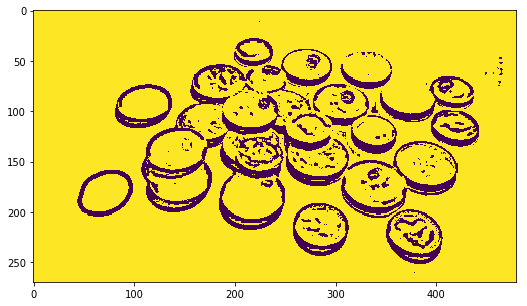

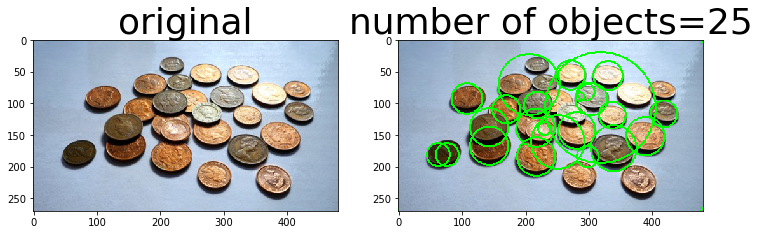

In [5]:
count, processed = NumberOfObjectsEstimator.run(
    images[0],
    adeptive=True, 
    type_of_threshold=cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
    min_distance=19,
)
imgs_show([(images[0], "original"), (processed, "number of objects={}".format(count))], 1)

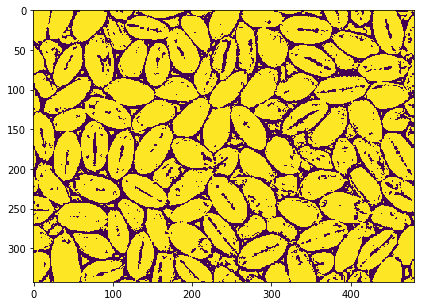

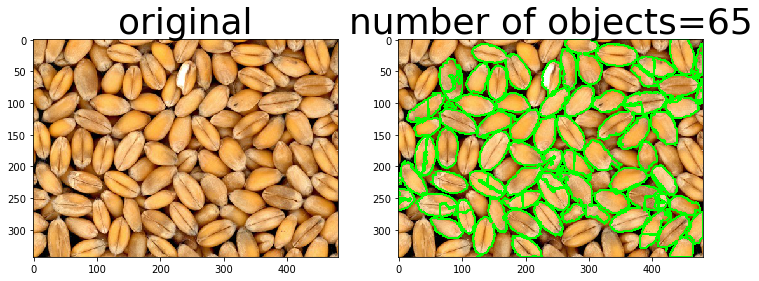

In [6]:
count, processed = NumberOfObjectsEstimator.run(
    images[1], 
    adeptive=True,
    use_cicrle=False,
    type_of_threshold=cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
    min_distance=20,
)
imgs_show([(images[1], "original"), (processed, "number of objects={}".format(count))], 1)

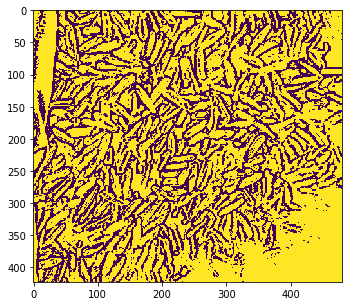

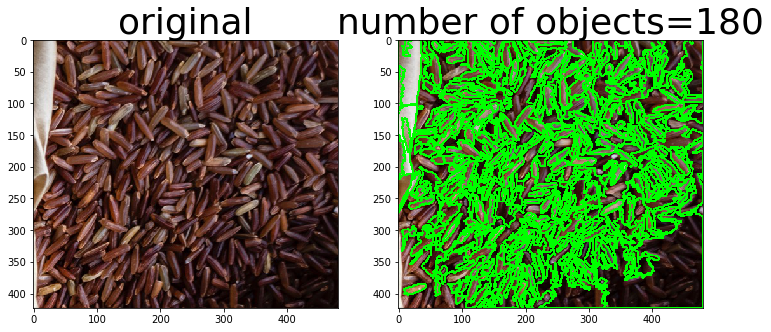

In [7]:
count, processed = NumberOfObjectsEstimator.run(
    images[2], 
    adeptive=True,
    use_cicrle=False,
    type_of_threshold=cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
    min_distance=15,
)
imgs_show([(images[2], "original"), (processed, "number of objects={}".format(count))], 1)

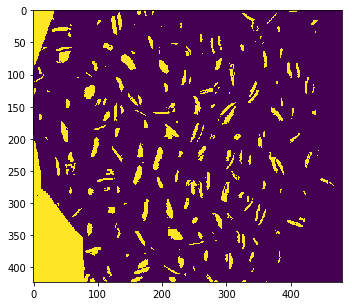

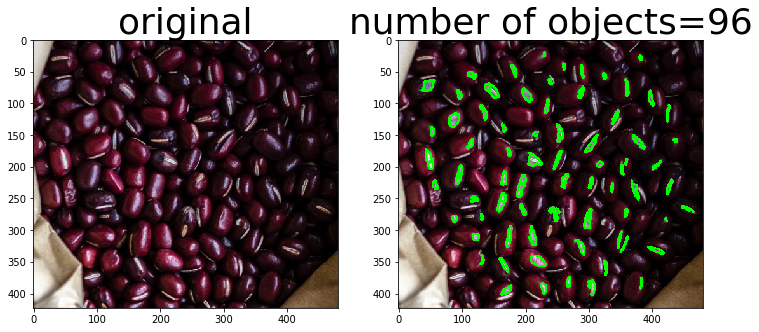

In [8]:
count, processed = NumberOfObjectsEstimator.run(
    images[3], 
    adeptive=False,
    use_cicrle=False,
    min_distance=25,
)
imgs_show([(images[3], "original"), (processed, "number of objects={}".format(count))], 1)

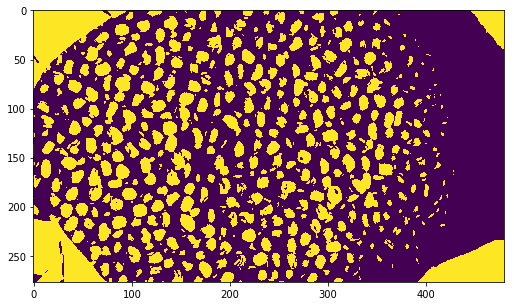

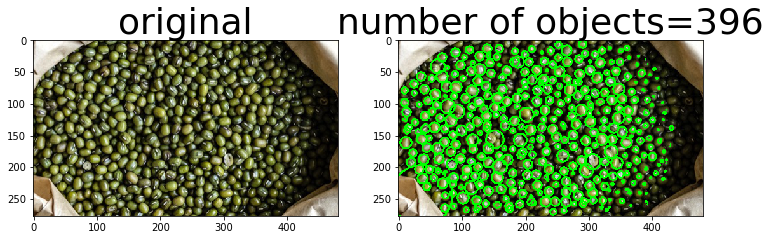

In [9]:
count, processed = NumberOfObjectsEstimator.run(
    images[4], 
    adeptive=False,
    use_cicrle=True,
    min_distance=7,
)
imgs_show([(images[4], "original"), (processed, "number of objects={}".format(count))], 1)

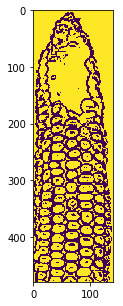

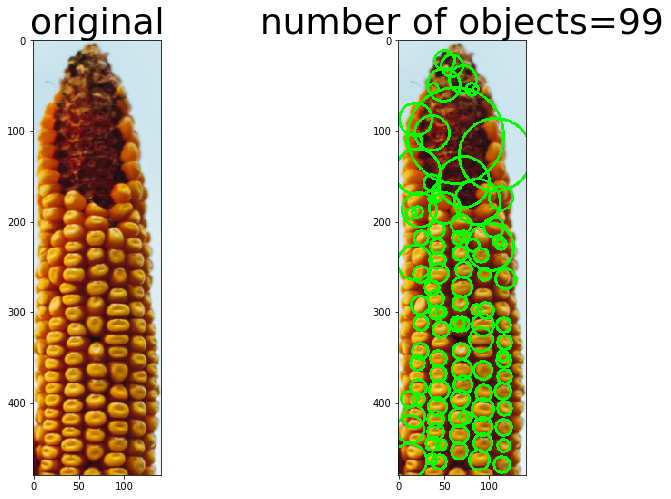

In [10]:
count, processed = NumberOfObjectsEstimator.run(
    images[5], 
    adeptive=True,
    use_cicrle=True,
    type_of_threshold=cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
    min_distance=11,
)
imgs_show([(images[5], "original"), (processed, "number of objects={}".format(count))], 1)

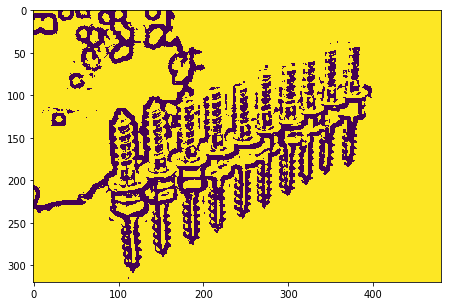

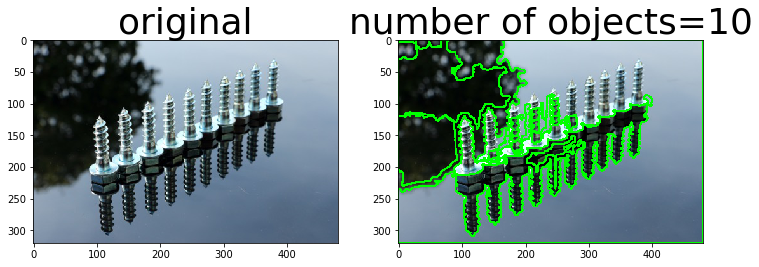

In [12]:
count, processed = NumberOfObjectsEstimator.run(
    images[6], 
    adeptive=True,
    use_cicrle=False,
    min_distance=30,
    type_of_threshold=cv2.ADAPTIVE_THRESH_MEAN_C, 
)
imgs_show([(images[6], "original"), (processed, "number of objects={}".format(count))], 1)

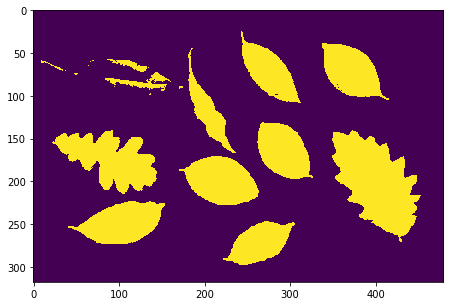

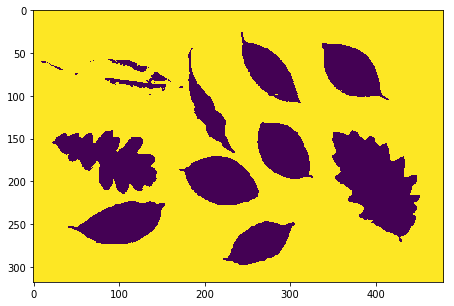

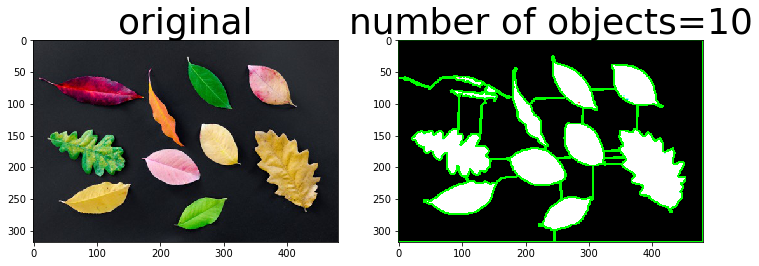

In [13]:
thresh = cv2.threshold(cv2.cvtColor(images[7], cv2.COLOR_BGR2GRAY), 60, 255, cv2.THRESH_BINARY)[1]
img_show(thresh)

count, processed = NumberOfObjectsEstimator.run(
    cv2.cvtColor(thresh, cv2.COLOR_BAYER_BG2BGR), 
    adeptive=False,
    use_cicrle=False,
    min_distance=15,
    type_of_threshold=cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
)
imgs_show([(images[7], "original"), (processed, "number of objects={}".format(count))], 1)

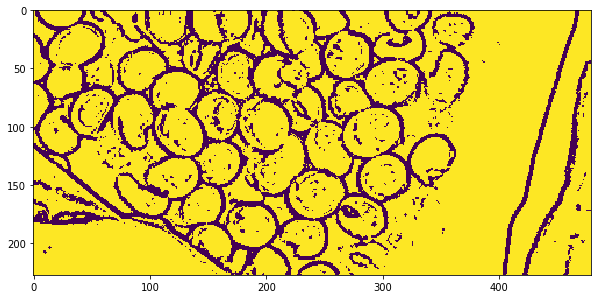

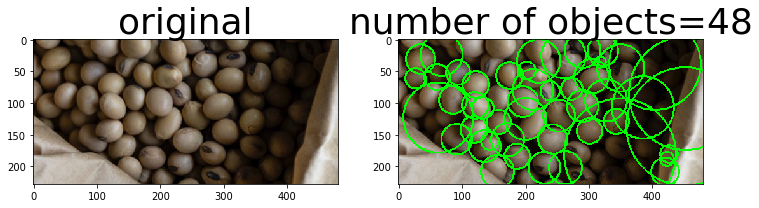

In [14]:
count, processed = NumberOfObjectsEstimator.run(
    images[8], 
    adeptive=True,
    use_cicrle=True,
    min_distance=18,
    type_of_threshold=cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
)
imgs_show([(images[8], "original"), (processed, "number of objects={}".format(count))], 1)

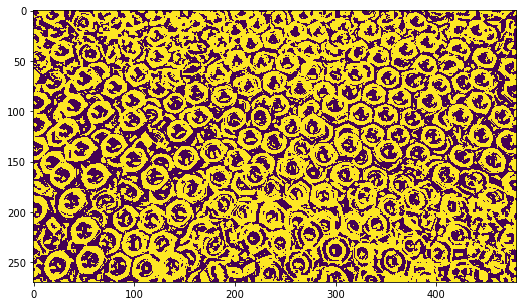

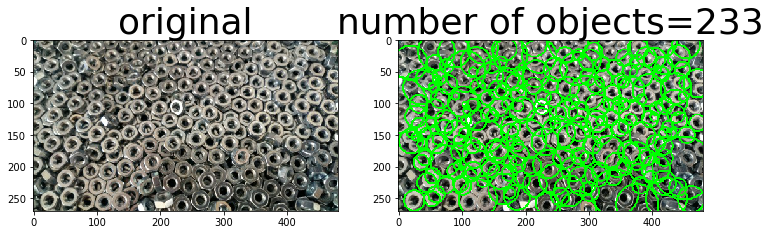

In [15]:
count, processed = NumberOfObjectsEstimator.run(
    images[9], 
    adeptive=True,
    use_cicrle=True,
    min_distance=12,
    type_of_threshold=cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
)
imgs_show([(images[9], "original"), (processed, "number of objects={}".format(count))], 1)

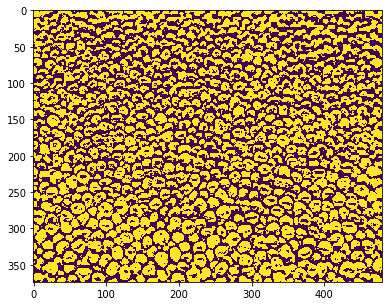

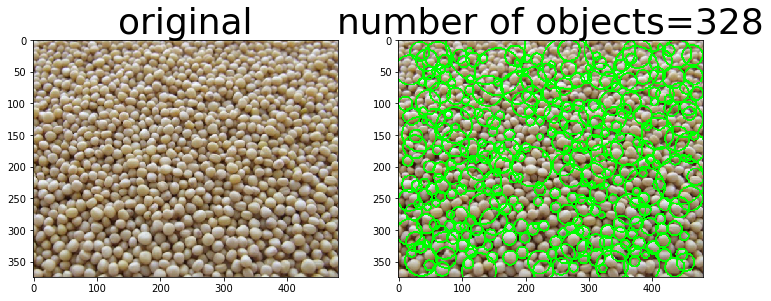

In [16]:
count, processed = NumberOfObjectsEstimator.run(
    images[10], 
    adeptive=True,
    use_cicrle=True,
    min_distance=12,
    type_of_threshold=cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
)
imgs_show([(images[10], "original"), (processed, "number of objects={}".format(count))], 1)

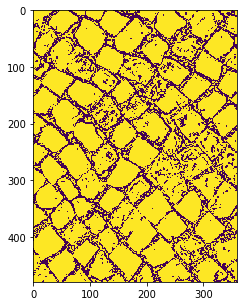

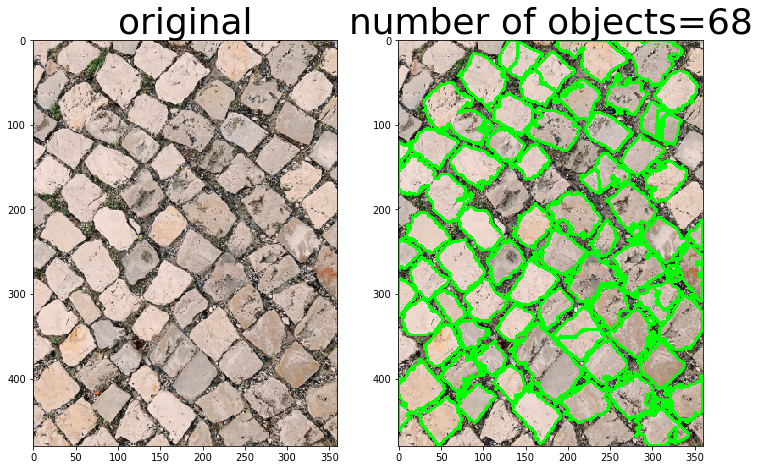

In [17]:
count, processed = NumberOfObjectsEstimator.run(
    images[11], 
    adeptive=True,
    use_cicrle=False,
    min_distance=20,
    type_of_threshold=cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
)
imgs_show([(images[11], "original"), (processed, "number of objects={}".format(count))], 1)